In [0]:
import tensorflow as tf
from keras.preprocessing.image import load_img, save_img, img_to_array
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

from keras.applications import vgg19
import numpy as np
import time

In [0]:
tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))

Eager execution: True


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
cd /content/drive/My Drive


/content/drive/My Drive


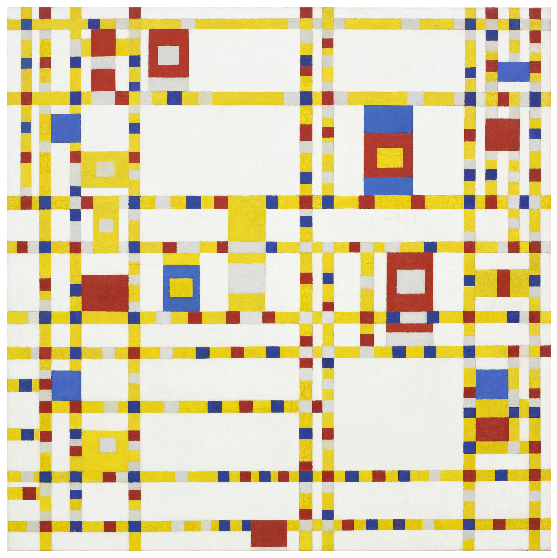

In [0]:
import matplotlib.pyplot as plt

base_image_path = 'nyc.jpg'
style_reference_path = "broadway-boogie.jpg"

# View both the images side by side
base = plt.imread(base_image_path)
style = plt.imread(style_reference_path)
plt.axis('off')
plt.imshow(base)
plt.imshow(style)

(-0.5, 1997.5, 1999.5, -0.5)

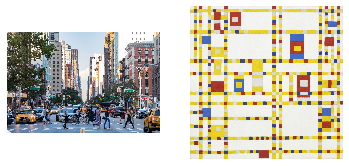

In [0]:
# Plotting it side by side 
# idea is to divide the area into subplots and then
# call them like coordinates x,y

f, axarr = plt.subplots(1,2)
plt.axis('off')
axarr[0].imshow(base)
axarr[0].axis('off')
axarr[1].imshow(style)
axarr[1].axis('off')

In [0]:
 
total_variation_weight = 1.0
style_weight = 1.0
content_weight = 0.025

# get the height and width - default keras
# packages - load_img
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

In [0]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

In [0]:
def deprocess_image(x): 
    #keras implementation -> https://github.com/keras-team/keras/blob/master/examples/neural_style_transfer.py
    if K.image_data_format() == 'channels_first':
        x = x.reshape((3, img_nrows, img_ncols))
        x = x.transpose((1, 2, 0))
    else:
        x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [0]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1','block2_conv1','block3_conv1', 'block4_conv1', 'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [0]:
# Functional API - to get a model
def get_model():  
  # Load VGG 19 model 
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get all the style output layers 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  # Get all the content output layers
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(vgg.input, model_outputs)

In [0]:
def get_content_loss(base_content, target):
  # it is simple euclidean distance between images
  return tf.reduce_mean(tf.square(base_content - target))

In [0]:
def gram_matrix(input_tensor): 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  # Dot product of every vector being done here
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  # You then subtract gram matrices to get style loss!
  return tf.reduce_mean(tf.square(gram_style - gram_target))

In [0]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  
  style_weight, content_weight = loss_weights
  
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_loss = 0
  content_loss = 0

  # calculate style losses from all layers..
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_loss += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Calculate loss from all layers.. 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_loss += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  # Multiplying by coefficients! style -weight and content weight
  style_loss *= style_weight
  content_loss *= content_weight

  # Get total loss -> sum of both of them
  loss = style_loss + content_loss
  return loss, style_loss, content_loss

In [0]:
def style_transfer(content_path, style_path): 
  
  num_iterations=1000 
  content_weight=1e3
  style_weight=1e-2

  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false.   
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False

  # Load our images in 
  content_image = preprocess_image(content_path)
  style_image = preprocess_image(style_path)
  
  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = preprocess_image(content_path)
  init_image = tf.Variable(init_image, dtype=tf.float32)
    
  # Adam optimizer - used instead of bfgs
  # Authors use l-bfgs - which is a quasi newton hill climbing optimization algorithm.
  opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # to capture best loss - initially set to maximum -> float('inf')
  best_loss, best_img = float('inf'), None
  
  
  loss_weights = (style_weight, content_weight)
  # config style -- influenced from 
  # https://medium.com/tensorflow/neural-style-transfer-creating-art-with-deep-learning-using-tf-keras-and-eager-execution-7d541ac31398
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # For displaying - 10 images per 100 iterations
  num_rows = 2
  num_cols = 5
  start_time = time.time() 
  global_start = time.time() #required for keeping track of total time
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  # Store Results
  imgs = []
  total_loss_list = []
  style_loss_list = []
  content_loss_list = []
  time_list = []

  for i in range(num_iterations):
    # compute the gradients and loss 
    with tf.GradientTape() as tape: 
        all_loss = compute_loss(**cfg)
    # Compute gradients wrt input image
    total_loss = all_loss[0]
    grads, all_loss = tape.gradient(total_loss, cfg['init_image']), all_loss
    loss, style_loss, content_loss = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # update loss to get the minimum most! 
      best_loss = loss
      best_img = deprocess_image(init_image.numpy())

    
      start_time = time.time()
      
      plot_img = init_image.numpy()
      plot_img = deprocess_image(plot_img)
      imgs.append(plot_img)
      # Can put them in logs for cleaner code..
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_loss, content_loss, time.time() - start_time))
      # This is used to store the losses and plot the values later on..
      total_loss_list.append('{:.4e}'.format(loss))
      style_loss_list.append('{:.4e}'.format(style_loss))
      content_loss_list.append('{:.4e}'.format(content_loss))
      time_list.append('{:.4e}'.format(time.time() - start_time))

  print('Total time: {:.4f}s'.format(time.time() - global_start))
  print(f'Total loss: {total_loss_list} and style loss: {style_loss_list} and content loss {content_loss_list}')
  
  # Simple plots of total loss, style loss and content loss using seaborn 
  plot_graphs(total_loss_list, style_loss_list, content_loss_list)
  
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      
  return best_img, best_loss

In [0]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

In [0]:
import seaborn as sns

def plot_graphs(total_loss_list, style_loss_list, content_loss_list):
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
  # Since iterations is know to be a 1000 iterations..
  iterations = [0,100,200,300,400,500,600,700,800,900]
  ax[0].plot(iterations, total_loss, sns.xkcd_rgb["medium green"], lw=3)
  ax[0].set_title('total loss')
  ax[1].plot(iterations, style_loss, sns.xkcd_rgb["denim blue"], lw=3)
  ax[1].set_title('style loss')
  ax[2].plot(iterations, content_loss, sns.xkcd_rgb["pale red"], lw=3) 
  ax[2].set_title('content loss')

  fig.tight_layout()

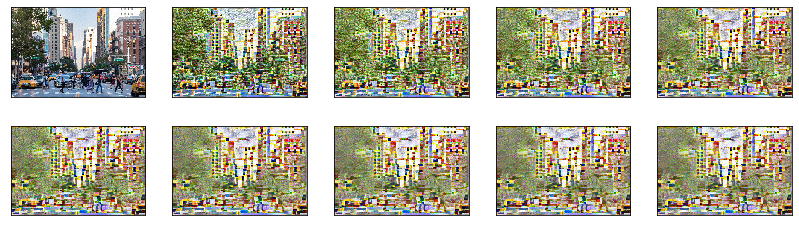

In [0]:
content_path = 'nyc.jpg'
style_path = "broadway-boogie.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

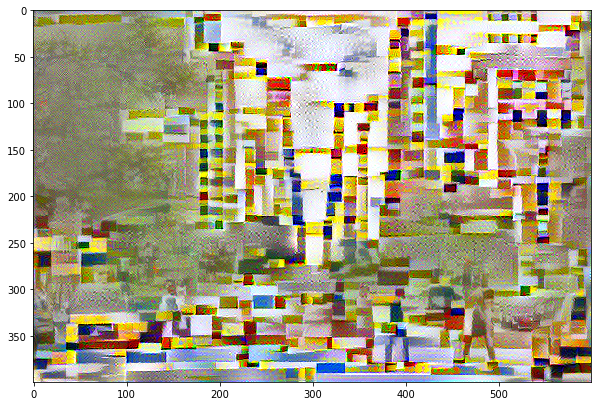

In [0]:
plt.imshow(best)

In [0]:
best_loss

<tf.Tensor: id=486205, shape=(), dtype=float32, numpy=8980860.0>

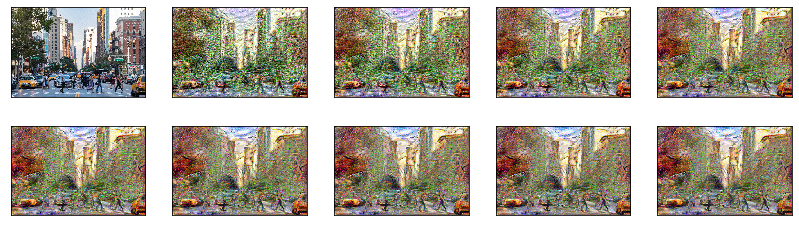

In [0]:
content_path = 'nyc.jpg'
style_path = "246 The Persistence of Memory 1931.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)



(-0.5, 599.5, 399.5, -0.5)

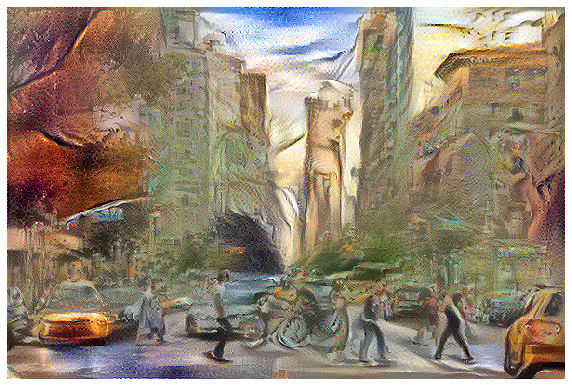

In [0]:
plt.imshow(best)
plt.axis('off')

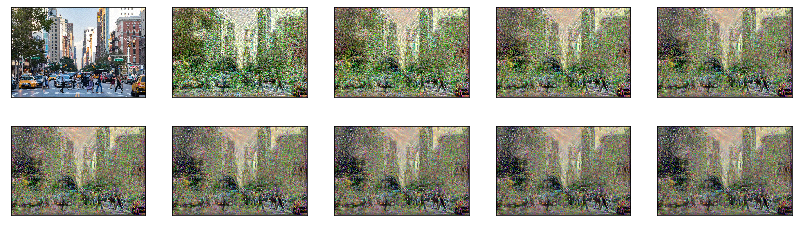

In [0]:
content_path = 'nyc.jpg'
style_path = "cri_000000339140.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

(-0.5, 599.5, 399.5, -0.5)

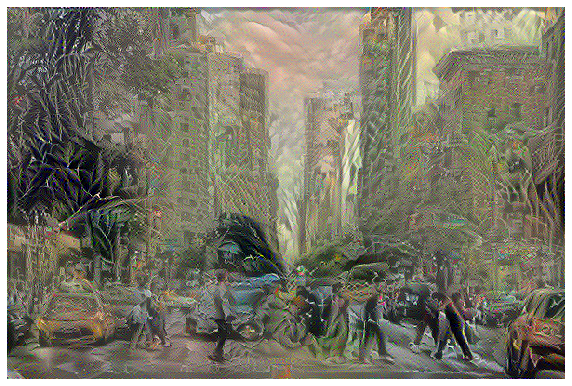

In [0]:
plt.imshow(best)
plt.axis('off')

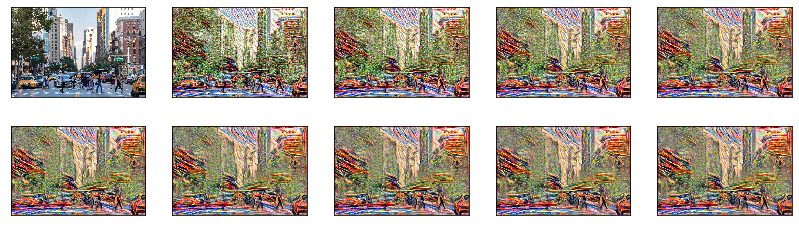

In [0]:
content_path = 'nyc.jpg'
style_path = "the-scream.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

(-0.5, 599.5, 399.5, -0.5)

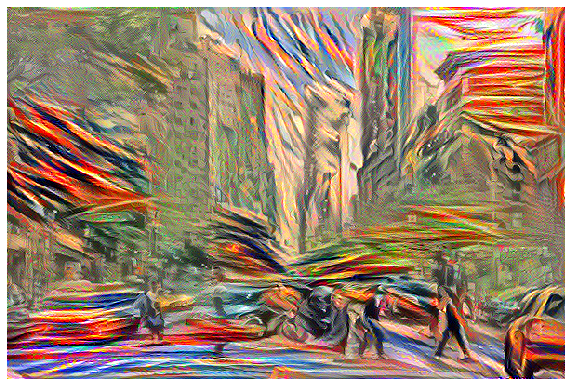

In [0]:
plt.imshow(best)
plt.axis('off')

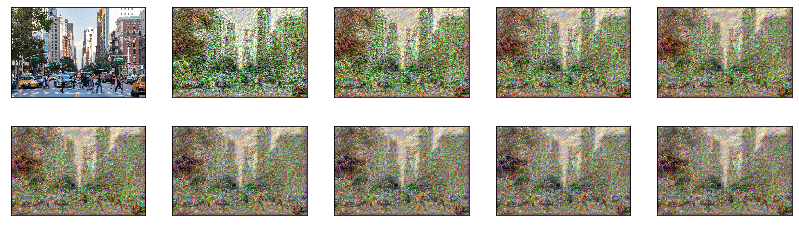

In [0]:
content_path = 'nyc.jpg'
style_path = "Shipwreck_turner.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

(-0.5, 599.5, 399.5, -0.5)

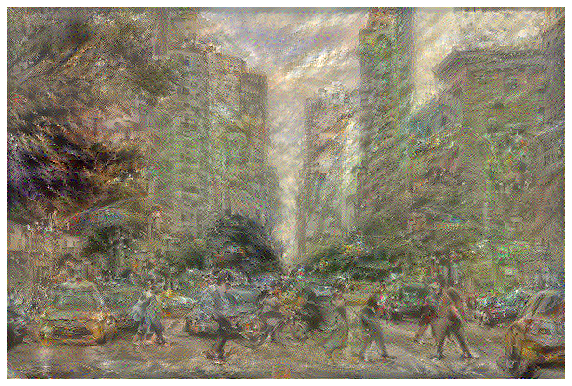

In [0]:
plt.imshow(best)
plt.axis('off')

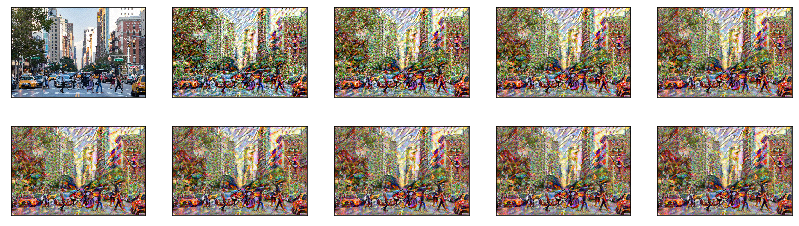

In [0]:
content_path = 'nyc.jpg'
style_path = "kandinsky.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

(-0.5, 599.5, 399.5, -0.5)

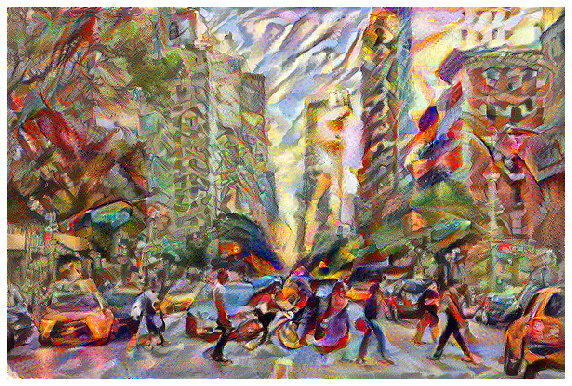

In [0]:
plt.imshow(best)
plt.axis('off')

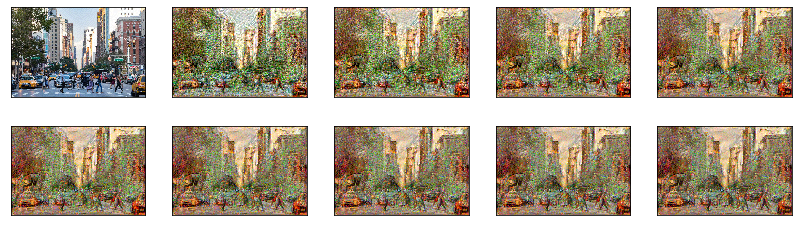

In [0]:
content_path = 'nyc.jpg'
style_path = "lastsupper.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

(-0.5, 599.5, 399.5, -0.5)

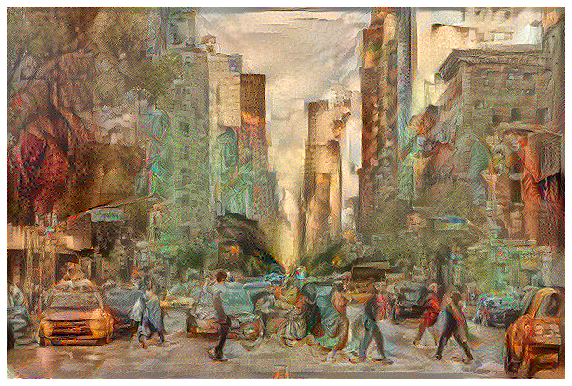

In [0]:
plt.imshow(best)
plt.axis('off')

Iteration: 0
Total loss: 8.4688e+08, style loss: 8.4688e+08, content loss: 0.0000e+00, time: 0.0081s
Iteration: 100
Total loss: 2.5472e+07, style loss: 1.9893e+07, content loss: 5.5785e+06, time: 0.0082s
Iteration: 200
Total loss: 1.1449e+07, style loss: 6.7593e+06, content loss: 4.6896e+06, time: 0.0080s
Iteration: 300
Total loss: 6.5966e+06, style loss: 2.9296e+06, content loss: 3.6671e+06, time: 0.0077s
Iteration: 400
Total loss: 4.5070e+06, style loss: 1.6042e+06, content loss: 2.9027e+06, time: 0.0078s
Iteration: 500
Total loss: 3.4320e+06, style loss: 1.0570e+06, content loss: 2.3750e+06, time: 0.0081s
Iteration: 600
Total loss: 2.7983e+06, style loss: 8.0920e+05, content loss: 1.9891e+06, time: 0.0080s
Iteration: 700
Total loss: 2.3923e+06, style loss: 6.7127e+05, content loss: 1.7211e+06, time: 0.0078s
Iteration: 800
Total loss: 2.1159e+06, style loss: 5.8278e+05, content loss: 1.5331e+06, time: 0.0077s
Iteration: 900
Total loss: 1.9217e+06, style loss: 5.2342e+05, content loss

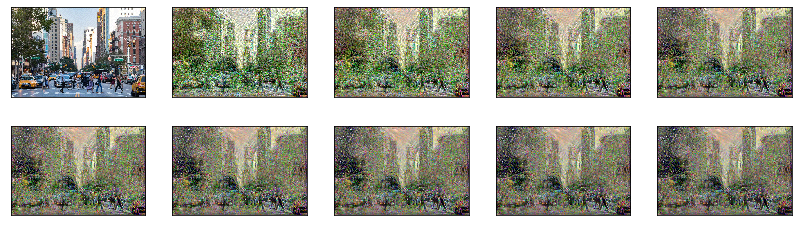

In [0]:
content_path = 'nyc.jpg'
style_path = "cri_000000339140.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

In [0]:
total_loss = [8.4688e+08, 2.5472e+07, 1.1449e+07, 6.5966e+06, 4.5070e+06, 3.4320e+06, 2.7983e+06, 2.3923e+06, 2.1159e+06, 1.9217e+06]
style_loss = [8.4688e+08, 1.9893e+07, 6.7593e+06, 2.9296e+06, 1.6042e+06, 1.0570e+06, 8.0920e+05, 6.7127e+05, 5.8278e+05, 5.2342e+05]
content_loss = [0.0000e+00, 5.5785e+06, 4.6896e+06, 3.6671e+06, 2.9027e+06, 2.3750e+06, 1.9891e+06, 1.7211e+06, 1.5331e+06, 1.3983e+06]
iterations = [0,100,200,300,400,500,600,700,800,900]

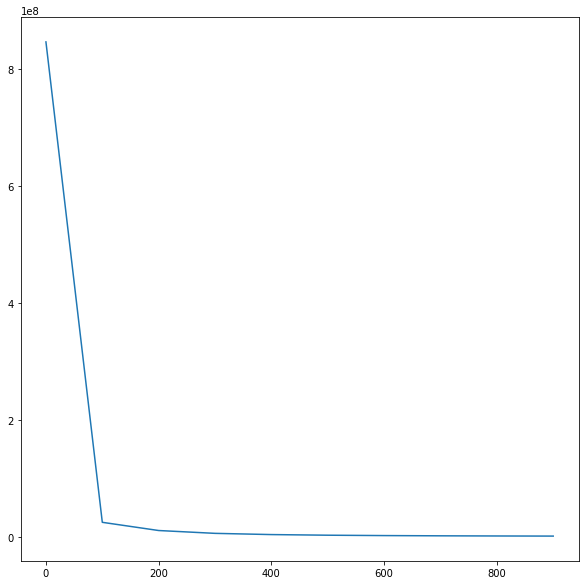

In [0]:
plt.plot(iterations, total_loss)


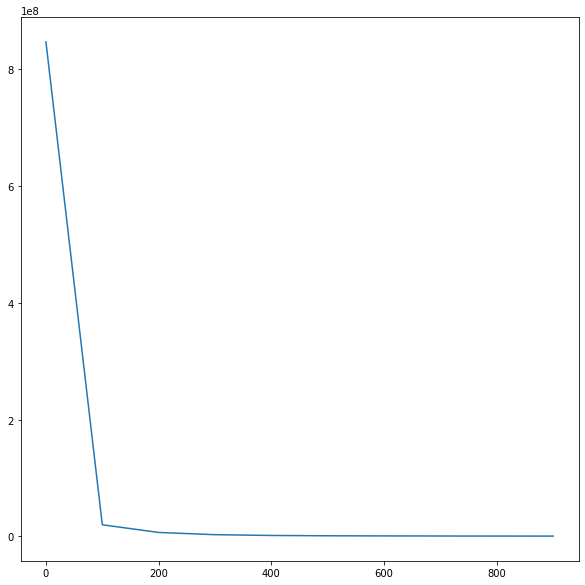

In [0]:
plt.plot(iterations, style_loss)


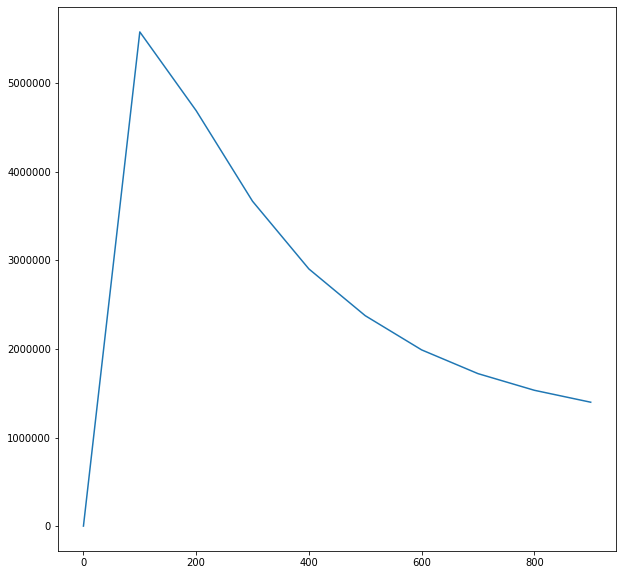

In [0]:
plt.plot(iterations, content_loss)


Iteration: 0
Total loss: 6.1366e+08, style loss: 6.1366e+08, content loss: 0.0000e+00, time: 0.0079s
Iteration: 100
Total loss: 1.4339e+07, style loss: 9.7780e+06, content loss: 4.5613e+06, time: 0.0081s
Iteration: 200
Total loss: 6.3189e+06, style loss: 3.1939e+06, content loss: 3.1250e+06, time: 0.0082s
Iteration: 300
Total loss: 3.6886e+06, style loss: 1.5097e+06, content loss: 2.1788e+06, time: 0.0081s
Iteration: 400
Total loss: 2.5661e+06, style loss: 9.4318e+05, content loss: 1.6230e+06, time: 0.0080s
Iteration: 500
Total loss: 2.0044e+06, style loss: 7.0688e+05, content loss: 1.2976e+06, time: 0.0077s
Iteration: 600
Total loss: 1.6879e+06, style loss: 5.9052e+05, content loss: 1.0974e+06, time: 0.0078s
Iteration: 700
Total loss: 1.4937e+06, style loss: 5.2013e+05, content loss: 9.7356e+05, time: 0.0078s
Iteration: 800
Total loss: 1.3668e+06, style loss: 4.7583e+05, content loss: 8.9100e+05, time: 0.0077s
Iteration: 900
Total loss: 1.2760e+06, style loss: 4.4537e+05, content loss

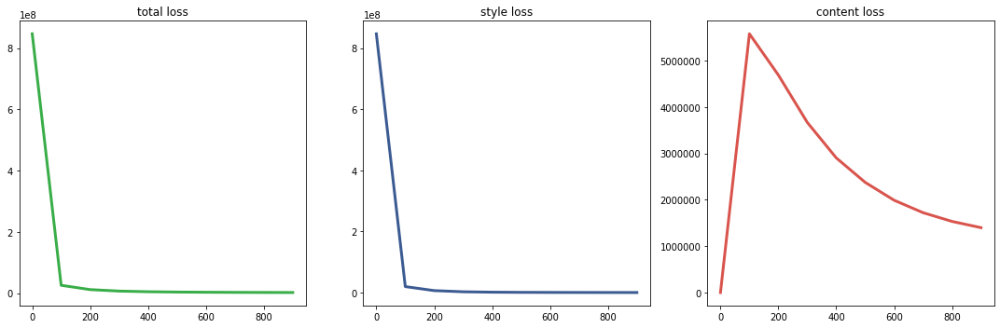

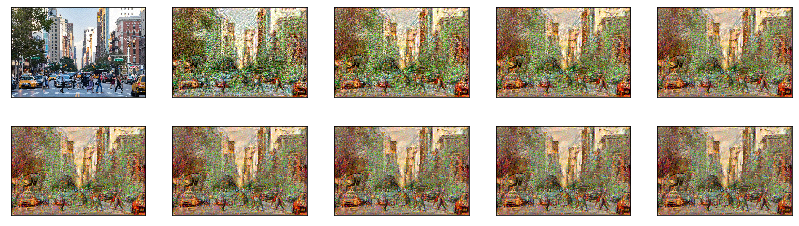

In [0]:
content_path = 'nyc.jpg'
style_path = "lastsupper.jpg"
best, best_loss = style_transfer(content_path, 
                                     style_path, num_iterations=1000)

(-0.5, 599.5, 399.5, -0.5)

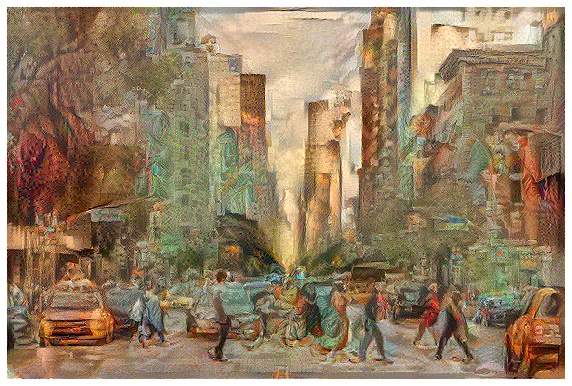

In [0]:
plt.imshow(best)
plt.axis('off')